## 【問題1】2×2マスのチェス盤の小麦の数
2×2マスのチェス盤をndarrayによって表現し、各マスの小麦の数を計算してください。左上のマスに小麦を1つ置いた後、その右が2つ、左下が4つ、右下が8つという風に進みます。

サンプルコードで作成したndarrayのshapeの変形を行ってください。

In [2]:
n_squares = 4
small_board_list = [1]
for _ in range(n_squares - 1):
    small_board_list.append(2*small_board_list[-1])
print("4マスの板に小麦を並べる（リスト）：{}".format(small_board_list))

4マスの板に小麦を並べる（リスト）：[1, 2, 4, 8]


In [3]:
import numpy as np

small_board_ndarray = np.array(small_board_list)
print("4マスの板に小麦を並べる（ndarray）：{}".format(small_board_ndarray))

4マスの板に小麦を並べる（ndarray）：[1 2 4 8]


In [4]:
small_board_ndarray.reshape([2, 2])

array([[1, 2],
       [4, 8]])

## 【問題2】n×mマスへの拡張
n×mマスのチェス盤の小麦の数を記したndarrayを返す関数を作成してください。そして、この関数を使い8×8マスのチェス盤の小麦の数を求めてください。

In [5]:
def chessboard_wheat(n=8, m=8):
    n_squares = n * m
    wheat = 1
    board = np.array([wheat * (2 ** i) for i in range(n_squares)])
    board = board.reshape([n, m])
    return board
    #print("累積の小麦の数：{}".format(bord.sum()))

In [6]:
chessboard_wheat(8,8)

array([[1.00000000e+00, 2.00000000e+00, 4.00000000e+00, 8.00000000e+00,
        1.60000000e+01, 3.20000000e+01, 6.40000000e+01, 1.28000000e+02],
       [2.56000000e+02, 5.12000000e+02, 1.02400000e+03, 2.04800000e+03,
        4.09600000e+03, 8.19200000e+03, 1.63840000e+04, 3.27680000e+04],
       [6.55360000e+04, 1.31072000e+05, 2.62144000e+05, 5.24288000e+05,
        1.04857600e+06, 2.09715200e+06, 4.19430400e+06, 8.38860800e+06],
       [1.67772160e+07, 3.35544320e+07, 6.71088640e+07, 1.34217728e+08,
        2.68435456e+08, 5.36870912e+08, 1.07374182e+09, 2.14748365e+09],
       [4.29496730e+09, 8.58993459e+09, 1.71798692e+10, 3.43597384e+10,
        6.87194767e+10, 1.37438953e+11, 2.74877907e+11, 5.49755814e+11],
       [1.09951163e+12, 2.19902326e+12, 4.39804651e+12, 8.79609302e+12,
        1.75921860e+13, 3.51843721e+13, 7.03687442e+13, 1.40737488e+14],
       [2.81474977e+14, 5.62949953e+14, 1.12589991e+15, 2.25179981e+15,
        4.50359963e+15, 9.00719925e+15, 1.80143985e+16, 3.

## 【問題3】小麦の数の合計
8×8マスのチェス盤の小麦の数の合計を求めてください。また、各列の平均を求め、それを棒グラフで可視化してください。

棒グラフはサンプルコードを用意しています。

In [7]:
board = chessboard_wheat(8,8)
print("8×8マスのチェス盤の小麦の数の合計:{}".format(board.sum()))

8×8マスのチェス盤の小麦の数の合計:1.8446744073709552e+19


In [8]:
board_mean = np.mean(board, axis=0)
board_mean

array([9.04252160e+15, 1.80850432e+16, 3.61700864e+16, 7.23401728e+16,
       1.44680346e+17, 2.89360691e+17, 5.78721383e+17, 1.15744277e+18])

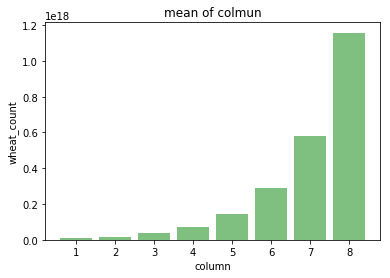

In [9]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.xlabel("column")
plt.ylabel("wheat_count")
plt.title("mean of colmun")
plt.bar(np.arange(1,9), board_mean, color="green", alpha= 0.5)
plt.show()

## 【問題4】小麦の数のヒートマップ
8×8マスのチェス盤の小麦の数をヒートマップとして可視化してください。

ヒートマップはサンプルコードを用意しています。

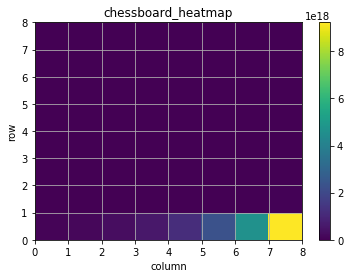

In [21]:
import seaborn as sns
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt

plt.xlabel("column")
plt.ylabel("row")
plt.title("chessboard_heatmap")
plt.pcolor(board[::-1])
plt.colorbar()
plt.grid()
plt.show()

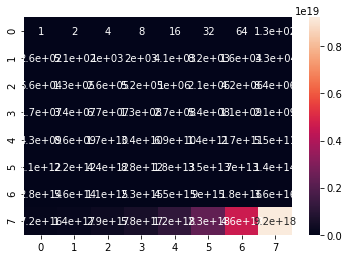

In [11]:
sns.heatmap(board, annot=True)

## 【問題5】後半は前半の何倍か
チェス盤の後半にある小麦の数は前半にある小麦の数の何倍かを求めてください。前半とは配列の0から3行目、後半は4から7行目です。

In [12]:
x = board[4:8].sum() / board[:4].sum() 

print("チェス盤の後半にある小麦の数は、前半にある小麦の数の{}倍".format(x))

チェス盤の後半にある小麦の数は、前半にある小麦の数の4294967296.0倍


## 【問題6】他の計算方法によるn×mマスへの拡張
問題2と同様の「n×mマスのチェス盤の小麦の数を記したndarrayを返す関数」を、np.append()を使ったものと、ブロードキャストを使ったもので新たに作成してください。

それらの関数を使い8×8マスのチェス盤の小麦の数を再び求めてください。

In [22]:
# np.append()を使った関数
def board_append(n=8, m=8):
    n_squares = n * m
    board_ndarray = np.array([1])
    for _ in range(n_squares-1):
        board_ndarray = np.append(board_ndarray, board_ndarray[-1]*2)
    board = board_ndarray.reshape([n,m])
    print(board)

In [23]:
board_append()

[[                   1                    2                    4
                     8                   16                   32
                    64                  128]
 [                 256                  512                 1024
                  2048                 4096                 8192
                 16384                32768]
 [               65536               131072               262144
                524288              1048576              2097152
               4194304              8388608]
 [            16777216             33554432             67108864
             134217728            268435456            536870912
            1073741824           2147483648]
 [          4294967296           8589934592          17179869184
           34359738368          68719476736         137438953472
          274877906944         549755813888]
 [       1099511627776        2199023255552        4398046511104
         8796093022208       17592186044416       3518437208

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: overflow encountered in long_scalars
  import sys


In [15]:
# ブロードキャストを使った関数
def board_broadcast(n=8, m=8):
    n_squares = n * m
    indices_of_squares = np.arange(n_squares)
    small_board_ndarray = 2**indices_of_squares
    board = small_board_ndarray.reshape(n,m)
    print(board)

In [16]:
board_broadcast()

[[                   1                    2                    4
                     8                   16                   32
                    64                  128]
 [                 256                  512                 1024
                  2048                 4096                 8192
                 16384                32768]
 [               65536               131072               262144
                524288              1048576              2097152
               4194304              8388608]
 [            16777216             33554432             67108864
             134217728            268435456            536870912
            1073741824           2147483648]
 [          4294967296           8589934592          17179869184
           34359738368          68719476736         137438953472
          274877906944         549755813888]
 [       1099511627776        2199023255552        4398046511104
         8796093022208       17592186044416       3518437208

## 【問題7】計算時間の比較
3種類の方法を見てきました。それぞれの計算時間をJupyter Notebookの%%timeitを用いて計測し、比較と考察を行ってください。

%%timeitはセル内のコードを複数回実行し、その平均実行時間を出力する働きをします。

<br>
→for文を使った関数が3.41 µs ± 91.6 ns となり、最も早い
 

In [17]:
%%timeit
chessboard_wheat(3,3)
#for文を使った関数

3.41 µs ± 91.6 ns per loop (mean ± std. dev. of 7 runs, 100000 loops each)


In [18]:
%%timeit
board_append(3,3)
#np.appendを使った関数

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

In [19]:
%%timeit
board_broadcast(3,3)
#ブロードキャストを使った関数

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 6

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 

 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [  8  16  32]
 [ 64 128 256]]
[[  1   2   4]
 [ 